Importing Face Mask Dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Importing the Dependencies**

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from sklearn.model_selection import train_test_split

In [4]:
with_powdery = os.listdir('/content/drive/MyDrive/PD-dataset/Train/Train/Powdery')
print(with_powdery[0:5])
print(with_powdery[-5:])

['8652368cba3f4cd3.jpg', '829a171f2d71c3e5.jpg', '839b68005e67d5db.jpg', '820a7abd7594fc45.jpg', '806d7d0df8cae3c2.jpg']
['ff38378920ba812f.jpg', 'fff094a1d85289a5.jpg', 'fe95c360952ec12d.jpg', 'facda492459656d4.jpg', 'fb90a2d38a48e3e5.jpg']


In [5]:
with_rust = os.listdir('/content/drive/MyDrive/PD-dataset/Train/Train/Rust')
print(with_rust[0:5])
print(with_rust[-5:])

['81d5c3709f4e314f.jpg', '807947b90eb77856.jpg', '81a063b69c99ed9e.jpg', '81cd969c7d0944fb.jpg', '81c97ef498cc87c3.jpg']
['ffb7de908858884a.jpg', 'fc3c93c923967303.jpg', 'f8723f62139ac730.jpg', 'f6e501f5b0975423.jpg', 'ffcbc7d2e030e050.jpg']


In [6]:
healthy = os.listdir('/content/drive/MyDrive/PD-dataset/Train/Train/Healthy')
print(healthy[0:5])
print(healthy[-5:])

['80aa53172b9fc78d.jpg', '802b59956a7aa5e7.jpg', '80a4c7f6ad9a55d8.jpg', '804e1eda54919fbb.jpg', '803bcb65f486e39a.jpg']
['9fe174c9e157850a.jpg', '9fa495beda4d0055.jpg', '9fcb68a0fc2a60ae.jpg', '9fd72a18e1691527.jpg', '9fd08acafc84e664.jpg']


In [7]:
print('Number of powdery plants images:', len(with_powdery))
print('Number of rust in plants images:', len(with_rust))
print('Number of healthy plants images:', len(healthy))

Number of powdery plants images: 430
Number of rust in plants images: 443
Number of healthy plants images: 458


**Creating Labels for the three class of Images**

with powdery  -->  1

with rust  -->  0

healthy  -->  2

In [8]:
# create the labels

with_powdery_labels = [1]*430

with_rust_labels = [0]*443

healthy_labels = [2]*458

In [9]:
labels = with_powdery_labels + with_rust_labels + healthy_labels

print(len(labels))
print(labels[0:5])
print(labels[-5:])

1331
[1, 1, 1, 1, 1]
[2, 2, 2, 2, 2]


**Displaying the Images**

**Image Processing**

1. Resize the Images

2. Convert the images to numpy arrays

In [10]:
# convert images to numpy arrays+

with_powdery_path = '/content/drive/MyDrive/PD-dataset/Train/Train/Powdery/'

data = []

for img_file in with_powdery:

  image = Image.open(with_powdery_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)


with_rust_path = '/content/drive/MyDrive/PD-dataset/Train/Train/Rust/'

for img_file in with_rust:

  image = Image.open(with_rust_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)


healthy_path = '/content/drive/MyDrive/PD-dataset/Train/Train/Healthy/'

for img_file in healthy:

  image = Image.open(healthy_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

In [11]:
# converting image list and label list to numpy arrays

X = np.array(data)
Y = np.array(labels)

In [ ]:
print(X.shape)
print(Y.shape)

(1331, 128, 128, 3)
(1331,)


**Train Test Split**

In [12]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [ ]:
print(X.shape, X_train.shape, X_test.shape)

(1331, 128, 128, 3) (1064, 128, 128, 3) (267, 128, 128, 3)


In [13]:
# scaling the data

X_train_scaled = X_train/255

X_test_scaled = X_test/255

**Building a Convolutional Neural Networks (CNN)**

In [14]:
import tensorflow as tf
from tensorflow import keras

In [26]:
num_of_classes = 3

model = keras.Sequential()

model.add(keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=(128,128,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))


model.add(keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu'))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(128, activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(64, activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(num_of_classes, activation='sigmoid'))

In [27]:
# compile the neural network
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['acc'])

In [34]:
# training the neural network
history = model.fit(X_train_scaled, Y_train, validation_split=0.1, epochs=10)

Epoch 1/10
30/30 [==============================] - 1s 23ms/step - loss: 0.0374 - acc: 0.9885 - val_loss: 0.4581 - val_acc: 0.9252
Epoch 2/10
30/30 [==============================] - 1s 18ms/step - loss: 0.0432 - acc: 0.9843 - val_loss: 0.3498 - val_acc: 0.9346
Epoch 3/10
30/30 [==============================] - 1s 19ms/step - loss: 0.0595 - acc: 0.9739 - val_loss: 0.2870 - val_acc: 0.9346
Epoch 4/10
30/30 [==============================] - 1s 20ms/step - loss: 0.0364 - acc: 0.9916 - val_loss: 0.3917 - val_acc: 0.9065
Epoch 5/10
30/30 [==============================] - 1s 21ms/step - loss: 0.0262 - acc: 0.9916 - val_loss: 0.3405 - val_acc: 0.9346
Epoch 6/10
30/30 [==============================] - 1s 20ms/step - loss: 0.0178 - acc: 0.9958 - val_loss: 0.3895 - val_acc: 0.9346
Epoch 7/10
30/30 [==============================] - 1s 20ms/step - loss: 0.0252 - acc: 0.9875 - val_loss: 0.4547 - val_acc: 0.9159
Epoch 8/10
30/30 [==============================] - 1s 20ms/step - loss: 0.0223 - a

**Model Evaluation**

In [35]:
loss, accuracy = model.evaluate(X_test_scaled, Y_test)
print('Test Accuracy =', accuracy)

9/9 [==============================] - 0s 8ms/step - loss: 0.4383 - acc: 0.9213
Test Accuracy = 0.9213483333587646


**Predictive System**

Path of the image to be predicted: /content/drive/MyDrive/PD-dataset/Test/Test/Rust/84c2b48da27b8cf7.jpg


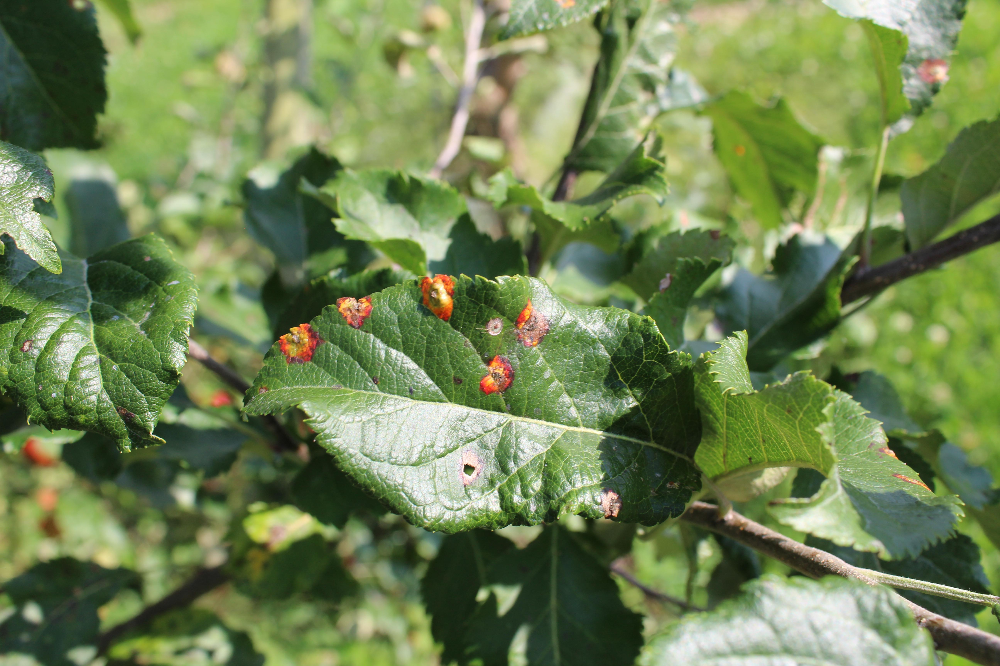

1/1 [==============================] - 0s 103ms/step
[[9.999999e-01 2.831897e-06 5.648066e-01]]
0
The is plant with rust.


In [37]:

input_image_path = input('Path of the image to be predicted: ')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized = cv2.resize(input_image, (128,128))

input_image_scaled = input_image_resized/255

input_image_reshaped = np.reshape(input_image_scaled, [1,128,128,3])

input_prediction = model.predict(input_image_reshaped)

print(input_prediction)


input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 1:
  print('The image is plant with powdery.')

if input_pred_label == 0:
  print('The is plant with rust.')

if input_pred_label == 2:
  print('The plant is healthy.')